## Data Collection and Cleaning

<strong>BMI Datasets</strong>

<strong>Read India Data</strong>

In [1]:
import pandas as pd

In [299]:
label_file_india = "./india_BMI.csv"
label_file_holly = "vip/annotation.csv"
label_file_prison = "images/output.csv"

In [300]:
india_df = pd.read_csv(label_file_india)
india_df

,id,UID,name,height,weight,BMI
0,1,akshay,akshay kumar,1.78,80,25.249337
1,2,ja,john abraham,1.82,94,28.378215
2,3,varun,varun dhawan,1.68,78,27.636054
3,4,tiger,Tiger shroff,1.75,72,23.510204
4,5,salman,Salman khan,1.74,75,24.772097
5,6,srk,Shahrukh khan,1.73,75,25.059307
6,7,ayushman,ayushman khurana,1.68,72,25.510204
7,8,vikky,vicky kaushal,1.83,80,23.888441
8,9,rajkumar,rajkumar rao,1.70,72,24.913495
9,10,nawaz,nawazuddin,1.68,60,21.258503


<strong>Read Hollywood Data</strong>

In [301]:
holly_df = pd.read_csv(label_file_holly)
holly_df

,image,height,weight,BMI
0,f_001,1.55,61.0,25.390219
1,f_002,1.76,85.0,27.440599
2,f_003,1.78,56.0,17.674536
3,f_004,1.63,63.0,23.711845
4,f_005,1.76,54.0,17.432851
...,...,...,...,...
1021,m_509,1.91,116.0,31.797374
1022,m_510,1.93,111.0,29.799458
1023,m_511,1.88,109.0,30.839746
1024,m_512,1.78,75.0,23.671254


<strong>Read Prison Data</strong>

In [302]:
prison_df = pd.read_csv(label_file_prison)
prison_df

,Unnamed: 0,height,weight,BMI
0,0,1.7780,79.378665,25.109628
1,1,1.8288,95.254398,28.480828
2,2,1.6764,61.688562,21.950749
3,3,1.7780,63.502932,20.087702
4,4,1.7780,72.574779,22.957374
...,...,...,...,...
296,296,1.8796,115.666054,32.739727
297,297,1.8034,63.502932,19.525836
298,298,1.8034,63.502932,19.525836
299,299,1.8034,63.502932,19.525836


<strong>Images Datasets</strong>

In [303]:
from glob import glob
from pathlib import Path as p

<strong>Get Image Path Fuction</strong>

In [304]:
def get_index_of_digit(string):
    import re
    match = re.search("\d", p(string).stem)
    return match.start(0)

In [305]:
data_folder_india = "india_images"
data_folder_holly = "vip/data"
data_folder_prison = "images"

<strong>Get India Images</strong>

In [306]:
india_files = glob(data_folder_india+"/*")
india_jpgs = sorted([img for img in india_files if ".jpg" in img or ".jpeg" in img or "JPG" in img])
print("India Total {} photos ".format(len(india_jpgs)))

India Total 226 photos 


In [307]:
ind_path = [(p(images).stem[:(get_index_of_digit(p(images).stem))],images) for  images in india_jpgs ]
ind_image_df = pd.DataFrame(ind_path,columns=['UID','path'])
# print(ind_image_df)
ind_data_df = ind_image_df.merge(india_df)
# ind_data_df
ind_data_df = ind_data_df.drop(columns=['UID', 'id','name'])
ind_data_df

,path,height,weight,BMI
0,india_images/akshay1.jpeg,1.78,80,25.249337
1,india_images/akshay10.jpg,1.78,80,25.249337
2,india_images/akshay11.jpg,1.78,80,25.249337
3,india_images/akshay12.jpg,1.78,80,25.249337
4,india_images/akshay13.jpg,1.78,80,25.249337
...,...,...,...,...
221,india_images/vikky5.jpg,1.83,80,23.888441
222,india_images/vikky6.jpg,1.83,80,23.888441
223,india_images/vikky7.jpg,1.83,80,23.888441
224,india_images/vikky8.jpg,1.83,80,23.888441


<strong>Get Hollywood Images</strong>

In [308]:
holly_files = glob(data_folder_holly+"/*")
holly_jpgs = sorted([img for img in holly_files if ".jpg" in img or ".jpeg" in img or "JPG" in img])
print("Hollywood Total {} photos ".format(len(holly_jpgs)))

Hollywood Total 1026 photos 


In [309]:
hol_path = [(p(images).stem[:(get_index_of_digit(p(images).stem))],images) for  images in holly_jpgs ]
hol_image_df = pd.DataFrame(hol_path,columns=['UID','path'])
# print(hol_image_df)
hol_data_df = pd.concat( [hol_image_df, holly_df], axis=1 )
# hol_data_df
hol_data_df = hol_data_df.drop(columns=['UID', 'image'])
hol_data_df

,path,height,weight,BMI
0,vip/data/f_001.jpg,1.55,61.0,25.390219
1,vip/data/f_002.jpg,1.76,85.0,27.440599
2,vip/data/f_003.jpg,1.78,56.0,17.674536
3,vip/data/f_004.jpg,1.63,63.0,23.711845
4,vip/data/f_005.jpg,1.76,54.0,17.432851
...,...,...,...,...
1021,vip/data/m_509.jpg,1.91,116.0,31.797374
1022,vip/data/m_510.jpg,1.93,111.0,29.799458
1023,vip/data/m_511.jpg,1.88,109.0,30.839746
1024,vip/data/m_512.jpg,1.78,75.0,23.671254


<strong>Get Prison Images</strong>

In [310]:
prison_files = glob(data_folder_prison+"/*")
prison_jpgs = sorted([img for img in prison_files if ".jpg" in img or ".jpeg" in img or "JPG" in img])
print("Prison Total {} photos ".format(len(prison_jpgs)))

Prison Total 301 photos 


In [311]:
pri_path = [(p(images).stem[:(get_index_of_digit(p(images).stem))],images) for  images in prison_jpgs ]
pri_image_df = pd.DataFrame(pri_path,columns=['UID','path'])
# print(hol_image_df)
pri_data_df = pd.concat( [pri_image_df, prison_df], axis=1 )
# pri_data_df
pri_data_df = pri_data_df.drop(columns=['Unnamed: 0', 'UID'])
pri_data_df

,path,height,weight,BMI
0,images/1.jpg,1.7780,79.378665,25.109628
1,images/10.jpg,1.8288,95.254398,28.480828
2,images/100.jpg,1.6764,61.688562,21.950749
3,images/101.jpg,1.7780,63.502932,20.087702
4,images/102.jpg,1.7780,72.574779,22.957374
...,...,...,...,...
296,images/95.jpg,1.8796,115.666054,32.739727
297,images/96.jpg,1.8034,63.502932,19.525836
298,images/97.jpg,1.8034,63.502932,19.525836
299,images/98.jpg,1.8034,63.502932,19.525836


## Extract face embedding using facenet pretrained architecture

In [312]:
import face_recognition
import numpy as np

<strong>Set Face Recognition Function</strong>

In [313]:
def get_face_encoding(image_path):
    print(image_path, end = "")
    try:  
        picture_of_me = face_recognition.load_image_file(image_path)
        my_face_encoding = face_recognition.face_encodings(picture_of_me)
        if not my_face_encoding:
            print("  =====>  No face found!!!")
            return np.zeros(128).tolist(), 0
        print("  =====>  OK!!!")
        return my_face_encoding[0].tolist(), 1
    except(OSError, NameError):
        print('  =====>  OSError, Path:',image_path)
        return np.zeros(128).tolist(), 0

In [314]:
all_faces = []
OK_list = []

<strong>Indian features</strong>

In [315]:
for images in ind_data_df.path:
    face_enc, comf = get_face_encoding(images)
    all_faces.append(face_enc)
    OK_list.append(comf)

india_images/akshay1.jpeg  =====>  OK!!!
india_images/akshay10.jpg  =====>  OK!!!
india_images/akshay11.jpg  =====>  OK!!!
india_images/akshay12.jpg  =====>  OK!!!
india_images/akshay13.jpg  =====>  OK!!!
india_images/akshay14.jpg  =====>  OK!!!
india_images/akshay15.jpg  =====>  OK!!!
india_images/akshay16.jpg  =====>  OK!!!
india_images/akshay17.jpg  =====>  OK!!!
india_images/akshay18.jpg  =====>  OK!!!
india_images/akshay19.jpg  =====>  OK!!!
india_images/akshay2.jpeg  =====>  No face found!!!
india_images/akshay20.jpg  =====>  OK!!!
india_images/akshay3.jpg  =====>  OK!!!
india_images/akshay4.jpg  =====>  OK!!!
india_images/akshay5.jpg  =====>  OK!!!
india_images/akshay6.jpg  =====>  OK!!!
india_images/akshay7.jpg  =====>  OK!!!
india_images/akshay8.jpg  =====>  OK!!!
india_images/akshay9.jpg  =====>  OK!!!
india_images/amir1.jpg  =====>  OK!!!
india_images/amir10.jpg  =====>  OK!!!
india_images/amir11.jpg  =====>  OK!!!
india_images/amir12.jpg  =====>  OK!!!
india_images/amir13.j

/opt/anaconda3/lib/python3.7/site-packages/PIL/Image.py:2929: UserWarning: image file could not be identified because WEBP support not installed
  warnings.warn(message)


  =====>  OK!!!
india_images/amir3.jpg  =====>  OK!!!
india_images/amir4.jpeg  =====>  No face found!!!
india_images/amir5.jpg  =====>  OK!!!
india_images/amir7.jpeg  =====>  OK!!!
india_images/amir8.jpg  =====>  OK!!!
india_images/amir9.jpg  =====>  OK!!!
india_images/anupam2.jpg  =====>  OK!!!
india_images/anupam3.jpg  =====>  OK!!!
india_images/anupam4.jpg  =====>  OK!!!
india_images/anupam5.jpg  =====>  OK!!!
india_images/anupam6.jpg  =====>  OK!!!
india_images/anupam7.jpeg  =====>  OK!!!
india_images/anupam8.jpg  =====>  OK!!!
india_images/anurag1.jpg  =====>  OK!!!
india_images/anurag2.jpg  =====>  OK!!!
india_images/anurag3.jpg  =====>  OK!!!
india_images/anurag4.jpg  =====>  OK!!!
india_images/anurag5.jpg  =====>  OK!!!
india_images/arshad1.jpg  =====>  OK!!!
india_images/arshad10.jpg  =====>  OK!!!
india_images/arshad11.jpg  =====>  OK!!!
india_images/arshad12.jpeg  =====>  OK!!!
india_images/arshad13.jpg  =====>  OK!!!
india_images/arshad14.jpg  =====>  OK!!!
india_images/ars

<strong>Hollywood features</strong>

In [316]:
for images in hol_data_df.path:
    face_enc, comf = get_face_encoding(images)
    all_faces.append(face_enc)
    OK_list.append(comf)

vip/data/f_001.jpg  =====>  OK!!!
vip/data/f_002.jpg  =====>  OK!!!
vip/data/f_003.jpg  =====>  OK!!!
vip/data/f_004.jpg  =====>  OK!!!
vip/data/f_005.jpg  =====>  OK!!!
vip/data/f_006.jpg  =====>  OK!!!
vip/data/f_007.jpg  =====>  OK!!!
vip/data/f_008.jpg  =====>  OK!!!
vip/data/f_009.jpg  =====>  OK!!!
vip/data/f_010.jpg  =====>  OK!!!
vip/data/f_011.jpg  =====>  OK!!!
vip/data/f_012.jpg  =====>  OK!!!
vip/data/f_013.jpg  =====>  OK!!!
vip/data/f_014.jpg  =====>  OK!!!
vip/data/f_015.jpg  =====>  OK!!!
vip/data/f_016.jpg  =====>  OK!!!
vip/data/f_017.jpg  =====>  OK!!!
vip/data/f_018.jpg  =====>  OK!!!
vip/data/f_019.jpg  =====>  OK!!!
vip/data/f_020.jpg  =====>  OK!!!
vip/data/f_021.jpg  =====>  OK!!!
vip/data/f_022.jpg  =====>  OK!!!
vip/data/f_023.jpg  =====>  OK!!!
vip/data/f_024.jpg  =====>  OK!!!
vip/data/f_025.jpg  =====>  OK!!!
vip/data/f_026.jpg  =====>  OK!!!
vip/data/f_027.jpg  =====>  OK!!!
vip/data/f_028.jpg  =====>  OK!!!
vip/data/f_029.jpg  =====>  OK!!!
vip/data/f_030

<strong>Prison features</strong>

In [317]:
for images in pri_data_df.path:
    face_enc, comf = get_face_encoding(images)
    all_faces.append(face_enc)
    OK_list.append(comf)

images/1.jpg  =====>  OK!!!
images/10.jpg  =====>  No face found!!!
images/100.jpg  =====>  OK!!!
images/101.jpg  =====>  No face found!!!
images/102.jpg  =====>  OK!!!
images/103.jpg  =====>  OK!!!
images/104.jpg  =====>  OK!!!
images/105.jpg  =====>  OK!!!
images/106.jpg  =====>  OK!!!
images/107.jpg  =====>  OK!!!
images/108.jpg  =====>  OK!!!
images/109.jpg  =====>  OK!!!
images/11.jpg  =====>  OK!!!
images/110.jpg  =====>  No face found!!!
images/111.jpg  =====>  OK!!!
images/112.jpg  =====>  OK!!!
images/113.jpg  =====>  OK!!!
images/114.jpg  =====>  OK!!!
images/115.jpg  =====>  OK!!!
images/116.jpg  =====>  OK!!!
images/117.jpg  =====>  OK!!!
images/118.jpg  =====>  OK!!!
images/119.jpg  =====>  OK!!!
images/12.jpg  =====>  No face found!!!
images/120.jpg  =====>  OK!!!
images/121.jpg  =====>  OK!!!
images/122.jpg  =====>  OK!!!
images/123.jpg  =====>  OK!!!
images/124.jpg  =====>  OK!!!
images/125.jpg  =====>  OK!!!
images/126.jpg  =====>  OK!!!
images/127.jpg  =====>  OK!!!
i

In [318]:
npall_faces = np.array(all_faces)
npOK_list = np.array(OK_list)

<strong>Delete Lost Data</strong>

In [319]:
OK_df = pd.DataFrame(data=OK_list, columns=['correct'])
# OK_df
# print(np.sum(OK_list))
# ind_data_df = ind_data_df.astype({'weight': 'float64'})
all_data_df = pd.concat([ind_data_df, pri_data_df, hol_data_df],  ignore_index = True)
all_df = pd.concat([all_data_df, OK_df], axis=1)
y_df = all_df[all_df['correct'] == 1]
y_df.reset_index(drop=True, inplace=True)
y_df = y_df.drop(columns=['correct'])
y_df

,path,height,weight,BMI
0,india_images/akshay1.jpeg,1.78,80.0,25.249337
1,india_images/akshay10.jpg,1.78,80.0,25.249337
2,india_images/akshay11.jpg,1.78,80.0,25.249337
3,india_images/akshay12.jpg,1.78,80.0,25.249337
4,india_images/akshay13.jpg,1.78,80.0,25.249337
...,...,...,...,...
1462,vip/data/m_503.jpg,1.95,95.0,24.983563
1463,vip/data/m_508.jpg,2.02,80.0,19.605921
1464,vip/data/m_509.jpg,1.91,116.0,31.797374
1465,vip/data/m_511.jpg,1.88,109.0,30.839746


In [320]:
print(y_df[y_df['height'] < 0].index)
y_df = y_df[y_df['height'] > 0]
y_df = y_df[y_df['weight'] > 0]
y_df = y_df[y_df['BMI'] > 0]
y_df.reset_index(drop=True, inplace=True)
y_df

Int64Index([353], dtype='int64')


,path,height,weight,BMI
0,india_images/akshay1.jpeg,1.78,80.0,25.249337
1,india_images/akshay10.jpg,1.78,80.0,25.249337
2,india_images/akshay11.jpg,1.78,80.0,25.249337
3,india_images/akshay12.jpg,1.78,80.0,25.249337
4,india_images/akshay13.jpg,1.78,80.0,25.249337
...,...,...,...,...
1461,vip/data/m_503.jpg,1.95,95.0,24.983563
1462,vip/data/m_508.jpg,2.02,80.0,19.605921
1463,vip/data/m_509.jpg,1.91,116.0,31.797374
1464,vip/data/m_511.jpg,1.88,109.0,30.839746


<strong>Delete Lost Images Features</strong>

In [321]:
ok = npOK_list.tolist()
facelist = npall_faces.tolist()
for i in range(len(facelist)-1, -1, -1):
    if ok[i] == 0 or i == 1342:
        del facelist[i]
# print(len(facelist))

## Set training and testing data

Data processing

In [25]:
from sklearn.model_selection import train_test_split

In [331]:
X = np.array(facelist)
Y_height = np.array(y_df['height'].values)
Y_weight = np.array(y_df['weight'].values)
Y_BMI = np.array(y_df['BMI'].values)
# print(Y_height)
# X.shape

In [332]:
CY_BMI_list = []
for i in range(len(Y_BMI)):
    if Y_BMI[i] < 18.5:
        CY_BMI_list.append('Underweight')
    elif Y_BMI[i] >= 18.5 and Y_BMI[i] < 25:
        CY_BMI_list.append('Normalweight')
    elif Y_BMI[i] >= 25 and Y_BMI[i] < 30:
        CY_BMI_list.append('Pre-obesity')
    else:
        CY_BMI_list.append('Obesity')

In [333]:
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1, test_size=0.1)
ss.get_n_splits(X, Y_BMI)
train, test = next(ss.split(X, Y_BMI)) 


x_train = X[train]
x_test = X[test]
y_train = Y_BMI[train]
y_test = Y_BMI[test]
cy_train = np.array(CY_BMI_list)[train]
cy_test = np.array(CY_BMI_list)[test]
dey_BMI_train = y_train - y_train.mean()
dey_BMI_test = y_test - y_train.mean()

x_train

array([[-0.01379297,  0.21758607,  0.13371781, ..., -0.18638821,
         0.09518999,  0.01438134],
       [-0.07981896,  0.06251249,  0.00190382, ..., -0.08516949,
         0.07395846,  0.02085469],
       [-0.15536454,  0.13713612, -0.01134169, ..., -0.10300636,
         0.03413381, -0.00227123],
       ...,
       [-0.0643929 ,  0.0102817 ,  0.03067894, ..., -0.07356144,
        -0.0121679 ,  0.0893369 ],
       [-0.06810453,  0.03917033,  0.06948813, ...,  0.02381108,
         0.01853281,  0.04208152],
       [-0.16651018,  0.22611293,  0.06138542, ..., -0.11985657,
         0.00563417, -0.04084897]])

In [25]:
# x_train, x_test, y_height_train, y_height_test, y_weight_train, y_weight_test ,y_BMI_train, y_BMI_test, cy_BMI_train, cy_BMI_test = train_test_split(X, Y_height, Y_weight, Y_BMI, CY_BMI_list, test_size=0.2, random_state=330)

standardization

In [37]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [457]:
# def report_goodness(model,X_test,y_test,predictor_log=True):
#     # Make predictions using the testing set
#     y_pred = model.predict(X_test)
#     y_true = y_test
#     if predictor_log:
#         y_true = np.log(y_test)
#     # The coefficients
#     # The mean squared error
#     print("Mean squared error: %.2f"      % mean_squared_error(y_true, y_pred))
#     # Explained variance score: 1 is perfect prediction
#     print('Variance score: %.2f' % r2_score(y_true, y_pred))
    
#     errors = abs(y_pred - y_true)
#     mape = 100 * np.mean(errors / y_true)
#     accuracy = 100 - mape
#     print('Model Performance')
#     print('Average Error: {:0.4f} degrees.'.format(np.mean(errors)))
#     print('Accuracy = {:0.2f}%.'.format(accuracy))

## Selecting Model

In [38]:
from sklearn.kernel_ridge import KernelRidge
from sklearn import  linear_model
from sklearn.svm import SVR
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

In [49]:
def rmse(predictions, targets):
    return np.sqrt(((predictions - targets) ** 2).mean())

<strong>Defining Error Range</strong>

In [28]:
# height +- 3cm
# weight +- 3kg
# BMI +- 2
from scipy.special import boxcox, inv_boxcox

def error_rate(pre, tar, typ, dpro = 'demean'):
    error_num = 0
    all_num = len(pre)
    if dpro == 'demean':
        if typ == 'height':
            for i in range(0, all_num):
                if tar[i] + 0.05 < pre[i] or tar[i] - 0.05 > pre[i]:
                    error_num = error_num + 1
        elif typ == 'weight':
            for i in range(0, all_num):
                if tar[i] + 3 < pre[i] or tar[i] - 3 > pre[i]:
                    error_num = error_num + 1
        elif typ == 'BMI':
            for i in range(0, all_num):
                if tar[i] + 2 < pre[i] or tar[i] - 2 > pre[i]:
                    error_num = error_num + 1
    
    elif dpro == 'log':
        pre = np.expm1(pre)
        if typ == 'height':
            for i in range(0, all_num):
                if tar[i] + 0.05 < pre[i] or tar[i] - 0.05 > pre[i]:
                    error_num = error_num + 1
        elif typ == 'weight':
            for i in range(0, all_num):
                if tar[i] + 3 < pre[i] or tar[i] - 3 > pre[i]:
                    error_num = error_num + 1
        elif typ == 'BMI':
            for i in range(0, all_num):
                if tar[i] + 2 < pre[i] or tar[i] - 2 > pre[i]:
                    error_num = error_num + 1
                    
    elif dpro == 'boxcox':
        pre = inv_boxcox(pre, 0.5)
        if typ == 'height':
            for i in range(0, all_num):
                if tar[i] + 0.05 < pre[i] or tar[i] - 0.05 > pre[i]:
                    error_num = error_num + 1
        elif typ == 'weight':
            for i in range(0, all_num):
                if tar[i] + 3 < pre[i] or tar[i] - 3 > pre[i]:
                    error_num = error_num + 1
        elif typ == 'BMI':
            for i in range(0, all_num):
                if tar[i] + 2 < pre[i] or tar[i] - 2 > pre[i]:
                    error_num = error_num + 1
                    
    error_rate = error_num / all_num
    return error_rate

## Regression

demean

In [29]:
dey_height_train = y_height_train - y_height_train.mean()
dey_height_test = y_height_test - y_height_train.mean()
dey_weight_train = y_weight_train - y_weight_train.mean()
dey_weight_test = y_weight_test - y_weight_train.mean()
dey_BMI_train = y_BMI_train - y_BMI_train.mean()
dey_BMI_test = y_BMI_test - y_BMI_train.mean()

<strong>Height</strong>

In [32]:
model_height = linear_model.LinearRegression()
model_height = model_height.fit(x_train, dey_height_train)
y_pred = model_height.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(dey_height_test, y_pred))
print('Error Rate: ', error_rate(y_pred, dey_height_test, 'height'))

Root mean squared error:  0.12160012133142342
Error Rate:  0.6206896551724138





<strong>Weight</strong>

In [33]:
model_weight = linear_model.LinearRegression()
model_weight = model_weight.fit(x_train, dey_weight_train)
y_pred = model_weight.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(dey_weight_test, y_pred))
print('Error Rate: ', error_rate(y_pred, dey_weight_test, 'weight'))

Root mean squared error:  15.03203277123686
Error Rate:  0.8029556650246306


<strong>BMI</strong>

In [34]:
model_BMI = linear_model.LinearRegression()
model_BMI = model_BMI.fit(x_train, dey_BMI_train)
y_pred = model_BMI.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(dey_BMI_test, y_pred))
print('Error Rate: ', error_rate(y_pred, dey_BMI_test, 'BMI'))

Root mean squared error:  3.7840257390924066
Error Rate:  0.43349753694581283


logmean

In [35]:
logy_height_train = np.log1p(y_height_train)
logy_weight_train = np.log1p(y_weight_train)
logy_BMI_train = np.log1p(y_BMI_train)

<strong>Height</strong>

In [36]:
model_height = linear_model.LinearRegression()
model_height = model_height.fit(x_train, logy_height_train)
y_pred = model_height.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(y_height_test, np.expm1(y_pred)))
print('Error Rate: ', error_rate(y_pred, y_height_test, 'height', 'log'))

Root mean squared error:  0.12215875807192866
Error Rate:  0.6305418719211823


<strong>Weight</strong>

In [37]:
model_weight = linear_model.LinearRegression()
model_weight = model_weight.fit(x_train, logy_weight_train)
y_pred = model_weight.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(y_weight_test, np.expm1(y_pred)))
print('Error Rate: ', error_rate(y_pred, y_weight_test, 'weight', 'log'))

Root mean squared error:  14.722231780431573
Error Rate:  0.7192118226600985


<strong>BMI</strong>

In [38]:
model_BMI = linear_model.LinearRegression()
model_BMI = model_BMI.fit(x_train, logy_BMI_train)
y_pred = model_BMI.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(y_BMI_test, np.expm1(y_pred)))
print('Error Rate: ', error_rate(y_pred, y_BMI_test, 'BMI', 'log'))

Root mean squared error:  3.7225646241562895
Error Rate:  0.3842364532019704


boxcox

In [39]:
# for i in range(len(y_height_train)):
#     print(y_height_train[i])

bcy_height_train = boxcox(y_height_train, 0.5)
bcy_weight_train = boxcox(y_weight_train, 0.5)
bcy_BMI_train = boxcox(y_BMI_train, 0.5)

<strong>Height</strong>

In [40]:
model_height = linear_model.LinearRegression()
model_height = model_height.fit(x_train, bcy_height_train)
y_pred = model_height.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(y_height_test, inv_boxcox(y_pred, 0.5)))
print('Error Rate: ', error_rate(y_pred, y_height_test, 'height', 'boxcox'))

Root mean squared error:  0.12200709663078065
Error Rate:  0.625615763546798


<strong>Weight</strong>

In [41]:
model_weight = linear_model.LinearRegression()
model_weight = model_weight.fit(x_train, bcy_weight_train)
y_pred = model_weight.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(y_weight_test, inv_boxcox(y_pred, 0.5)))
print('Error Rate: ', error_rate(y_pred, y_weight_test, 'weight', 'boxcox'))

Root mean squared error:  14.71794007284644
Error Rate:  0.7192118226600985


<strong>BMI</strong>

In [42]:
model_BMI = linear_model.LinearRegression()
model_BMI = model_BMI.fit(x_train, bcy_BMI_train)
y_pred = model_BMI.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(y_BMI_test, inv_boxcox(y_pred, 0.5)))
print('Error Rate: ', error_rate(y_pred, y_BMI_test, 'BMI', 'boxcox'))

Root mean squared error:  3.7399076750437996
Error Rate:  0.41379310344827586


<strong>KNN</strong>

demean

<strong>Height</strong>

In [43]:
from sklearn import neighbors
model_height = neighbors.KNeighborsRegressor(n_neighbors = 5)
model_height = model_height.fit(x_train, dey_height_train)
y_pred = model_height.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(dey_height_test, y_pred))
print('Error Rate: ', error_rate(y_pred, dey_height_test, 'height'))

Root mean squared error:  0.13088158826887475
Error Rate:  0.5911330049261084


<strong>Weight</strong>

In [44]:
model_weight = neighbors.KNeighborsRegressor(n_neighbors = 5)
model_weight = model_weight.fit(x_train, dey_weight_train)
y_pred = model_weight.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(dey_weight_test, y_pred))
print('Error Rate: ', error_rate(y_pred, dey_weight_test, 'weight'))

Root mean squared error:  16.679866037665974
Error Rate:  0.6551724137931034


<strong>BMI</strong>

In [45]:
model_BMI = neighbors.KNeighborsRegressor(n_neighbors = 5)
model_BMI = model_BMI.fit(x_train, dey_BMI_train)
y_pred = model_BMI.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(dey_BMI_test, y_pred))
print('Error Rate: ', error_rate(y_pred, dey_BMI_test, 'BMI'))

Root mean squared error:  3.8497846557165722
Error Rate:  0.3399014778325123


logmean

<strong>Height</strong>

In [46]:
model_height = neighbors.KNeighborsRegressor(n_neighbors = 6)
model_height = model_height.fit(x_train, logy_height_train)
y_pred = model_height.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(y_height_test, np.expm1(y_pred)))
print('Error Rate: ', error_rate(y_pred, y_height_test, 'height', 'log'))

Root mean squared error:  0.12796057766991398
Error Rate:  0.6108374384236454


<strong>Weight</strong>

In [47]:
model_weight = neighbors.KNeighborsRegressor(n_neighbors = 6)
model_weight = model_weight.fit(x_train, logy_weight_train)
y_pred = model_weight.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(y_weight_test, np.expm1(y_pred)))
print('Error Rate: ', error_rate(y_pred, y_weight_test, 'weight', 'log'))

Root mean squared error:  15.998232871210574
Error Rate:  0.6600985221674877


<strong>BMI</strong>

In [48]:
model_BMI = neighbors.KNeighborsRegressor(n_neighbors = 6)
model_BMI = model_BMI.fit(x_train, logy_BMI_train)
y_pred = model_BMI.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(y_BMI_test, np.expm1(y_pred)))
print('Error Rate: ', error_rate(y_pred, y_BMI_test, 'BMI', 'log'))

Root mean squared error:  3.72410353620934
Error Rate:  0.31527093596059114


boxcox

<strong>Height</strong>

In [49]:
model_height = neighbors.KNeighborsRegressor(n_neighbors = 5)
model_height = model_height.fit(x_train, bcy_height_train)
y_pred = model_height.predict(x_test)
print('Root mean squared error: ', rmse(y_height_test, inv_boxcox(y_pred, 0.5)))
print('Error Rate: ', error_rate(y_pred, y_height_test, 'height', 'boxcox'))

Root mean squared error:  0.1309877497061838
Error Rate:  0.5911330049261084


<strong>Weight</strong>

In [50]:
model_weight = neighbors.KNeighborsRegressor(n_neighbors = 5)
model_weight = model_weight.fit(x_train, bcy_weight_train)
y_pred = model_weight.predict(x_test)
print('Root mean squared error: ', rmse(y_weight_test, inv_boxcox(y_pred, 0.5)))
print('Error Rate: ', error_rate(y_pred, y_weight_test, 'weight', 'boxcox'))

Root mean squared error:  16.40637395583104
Error Rate:  0.645320197044335


<strong>BMI</strong>

In [51]:
model_BMI = neighbors.KNeighborsRegressor(n_neighbors = 5)
model_BMI = model_BMI.fit(x_train, bcy_BMI_train)
y_pred = model_BMI.predict(x_test)
print('Root mean squared error: ', rmse(y_BMI_test, inv_boxcox(y_pred, 0.5)))
print('Error Rate: ', error_rate(y_pred, y_BMI_test, 'BMI', 'boxcox'))

Root mean squared error:  3.8258313418112624
Error Rate:  0.33004926108374383


<strong>SVM</strong>

In [52]:
from sklearn import svm

demean

<strong>Height</strong>

In [53]:
model_height = svm.SVR()
model_height = model_height.fit(x_train, dey_height_train)
y_pred = model_height.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(dey_height_test, y_pred))
print('Error Rate: ', error_rate(y_pred, dey_height_test, 'height'))

Root mean squared error:  0.1161151069024417
Error Rate:  0.6305418719211823


<strong>Weight</strong>

In [54]:
model_weight = svm.SVR()
model_weight = model_weight.fit(x_train, dey_weight_train)
y_pred = model_weight.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(dey_weight_test, y_pred))
print('Error Rate: ', error_rate(y_pred, dey_weight_test, 'weight'))

Root mean squared error:  17.84087759603388
Error Rate:  0.645320197044335


<strong>BMI</strong>

In [55]:
model_BMI = svm.SVR()
model_BMI = model_BMI.fit(x_train, dey_BMI_train)
y_pred = model_BMI.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(dey_BMI_test, y_pred))
print('Error Rate: ', error_rate(y_pred, dey_BMI_test, 'BMI'))

Root mean squared error:  3.6912976603575256
Error Rate:  0.28078817733990147


logmean

<strong>Height</strong>

In [486]:
model_height = svm.SVR()
model_height = model_height.fit(x_train, logy_height_train)
y_pred = model_height.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(y_height_test, np.expm1(y_pred)))
print('Error Rate: ', error_rate(y_pred, y_height_test, 'height', 'log'))

Root mean squared error:  0.15402744074080182
Error Rate:  0.7755102040816326


<strong>Weight</strong>

In [487]:
model_weight = svm.SVR()
model_weight = model_weight.fit(x_train, logy_weight_train)
y_pred = model_weight.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(y_weight_test, np.expm1(y_pred)))
print('Error Rate: ', error_rate(y_pred, y_weight_test, 'weight', 'log'))

Root mean squared error:  14.259200144247137
Error Rate:  0.717687074829932


<strong>BMI</strong>

In [56]:
model_BMI = svm.SVR()
model_BMI = model_BMI.fit(x_train, logy_BMI_train)
y_pred = model_BMI.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(y_BMI_test, np.expm1(y_pred)))
print('Error Rate: ', error_rate(y_pred, y_BMI_test, 'BMI', 'log'))

Root mean squared error:  3.634448952959576
Error Rate:  0.4187192118226601


boxcox

<strong>Height</strong>

In [489]:
model_height = svm.SVR()
model_height = model_height.fit(x_train, bcy_height_train)
y_pred = model_height.predict(x_test)
print('Root mean squared error: ', rmse(y_height_test, inv_boxcox(y_pred, 0.5)))
print('Error Rate: ', error_rate(y_pred, y_height_test, 'height', 'boxcox'))

Root mean squared error:  0.1223220562463124
Error Rate:  0.6224489795918368


<strong>Weight</strong>

In [490]:
model_weight = svm.SVR()
model_weight = model_weight.fit(x_train, bcy_weight_train)
y_pred = model_weight.predict(x_test)
print('Root mean squared error: ', rmse(y_weight_test, inv_boxcox(y_pred, 0.5)))
print('Error Rate: ', error_rate(y_pred, y_weight_test, 'weight', 'boxcox'))

Root mean squared error:  14.17879052334576
Error Rate:  0.6326530612244898


<strong>BMI</strong>

In [57]:
model_BMI = svm.SVR()
model_BMI = model_BMI.fit(x_train, bcy_BMI_train)
y_pred = model_BMI.predict(x_test)
print('Root mean squared error: ', rmse(y_BMI_test, inv_boxcox(y_pred, 0.5)))
print('Error Rate: ', error_rate(y_pred, y_BMI_test, 'BMI', 'boxcox'))

Root mean squared error:  3.659345285271279
Error Rate:  0.31527093596059114


<strong>Random Forest</strong>

demean

In [58]:
from sklearn import ensemble

<strong>Height</strong>

In [103]:
model_height = ensemble.RandomForestRegressor(n_estimators=100)
model_height = model_height.fit(x_train, dey_height_train)
y_pred = model_height.predict(x_test)
print('Root mean squared error: ', rmse(dey_height_test, y_pred))
print('Error Rate: ', error_rate(y_pred, dey_height_test, 'height'))

Root mean squared error:  0.12316943569575214
Error Rate:  0.564625850340136


<strong>Weight</strong>

In [104]:
model_weight = ensemble.RandomForestRegressor(n_estimators=100)
model_weight = model_weight.fit(x_train, dey_weight_train)
y_pred = model_weight.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(dey_weight_test, y_pred))
print('Error Rate: ', error_rate(y_pred, dey_weight_test, 'weight'))

Root mean squared error:  16.9234309668887
Error Rate:  0.7142857142857143


<strong>BMI</strong>

In [59]:
model_BMI = ensemble.RandomForestRegressor(n_estimators=100)
model_BMI = model_BMI.fit(x_train, dey_BMI_train)
y_pred = model_BMI.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(dey_BMI_test, y_pred))
print('Error Rate: ', error_rate(y_pred, dey_BMI_test, 'BMI'))

Root mean squared error:  3.7025599366130244
Error Rate:  0.3694581280788177


logmean

<strong>Height</strong>

In [496]:
model_height = ensemble.RandomForestRegressor(n_estimators=100)
model_height = model_height.fit(x_train, logy_height_train)
y_pred = model_height.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(y_height_test, np.expm1(y_pred)))
print('Error Rate: ', error_rate(y_pred, y_height_test, 'height', 'log'))

Root mean squared error:  0.12039079554090527
Error Rate:  0.5578231292517006


<strong>Weight</strong>

In [497]:
model_weight = ensemble.RandomForestRegressor(n_estimators=100)
model_weight = model_weight.fit(x_train, logy_weight_train)
y_pred = model_weight.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(y_weight_test, np.expm1(y_pred)))
print('Error Rate: ', error_rate(y_pred, y_weight_test, 'weight', 'log'))

Root mean squared error:  15.28662103156337
Error Rate:  0.7040816326530612


<strong>BMI</strong>

In [60]:
model_BMI = ensemble.RandomForestRegressor(n_estimators=100)
model_BMI = model_BMI.fit(x_train, logy_BMI_train)
y_pred = model_BMI.predict(x_test)
# print('Coefficients: \n', model_height.coef_)
print('Root mean squared error: ', rmse(y_BMI_test, np.expm1(y_pred)))
print('Error Rate: ', error_rate(y_pred, y_BMI_test, 'BMI', 'log'))

Root mean squared error:  3.734348902691724
Error Rate:  0.3645320197044335


boxcox

<strong>Height</strong>

In [499]:
model_height = ensemble.RandomForestRegressor(n_estimators=100)
model_height = model_height.fit(x_train, bcy_height_train)
y_pred = model_height.predict(x_test)
print('Root mean squared error: ', rmse(y_height_test, inv_boxcox(y_pred, 0.5)))
print('Error Rate: ', error_rate(y_pred, y_height_test, 'height', 'boxcox'))

Root mean squared error:  0.1205456688839406
Error Rate:  0.5816326530612245


<strong>Weight</strong>

In [500]:
model_weight = ensemble.RandomForestRegressor(n_estimators=100)
model_weight = model_weight.fit(x_train, bcy_weight_train)
y_pred = model_weight.predict(x_test)
print('Root mean squared error: ', rmse(y_weight_test, inv_boxcox(y_pred, 0.5)))
print('Error Rate: ', error_rate(y_pred, y_weight_test, 'weight', 'boxcox'))

Root mean squared error:  16.200266002645865
Error Rate:  0.7040816326530612


<strong>BMI</strong>

In [61]:
model_BMI = ensemble.RandomForestRegressor(n_estimators=100)
model_BMI = model_BMI.fit(x_train, bcy_BMI_train)
y_pred = model_BMI.predict(x_test)
print('Root mean squared error: ', rmse(y_BMI_test, inv_boxcox(y_pred, 0.5)))
print('Error Rate: ', error_rate(y_pred, y_BMI_test, 'BMI', 'boxcox'))

Root mean squared error:  3.7013384787700376
Error Rate:  0.32019704433497537


## Classifier(BMI)

In [62]:
def classifier_error_rate(pre, tar):
    error_num = 0
    all_num = len(pre)
    for i in range(0, all_num):
        if tar[i] != pre[i]:
            error_num = error_num + 1
                    
    error_rate = error_num / all_num
    return error_rate

<strong>one-against-one</strong>

<strong>SVM</strong>

In [63]:
model_BMI = svm.SVC(decision_function_shape='ovo')
model_BMI = model_BMI.fit(x_train, cy_BMI_train)
y_pred = model_BMI.predict(x_test)
print('Error Rate: ', classifier_error_rate(y_pred, cy_BMI_test))

Error Rate:  0.29064039408866993


<strong>Gaussian</strong>

In [64]:
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
kernel = 1.0 * RBF(1.0)
model_BMI = GaussianProcessClassifier(kernel=kernel, random_state=330)
model_BMI = model_BMI.fit(x_train, cy_BMI_train)
y_pred = model_BMI.predict(x_test)
print('Error Rate: ', classifier_error_rate(y_pred, cy_BMI_test))

Error Rate:  0.3103448275862069


<strong>one-versus-rest</strong>

<strong>SVM</strong>

In [65]:
model_BMI = svm.LinearSVC(random_state=330, tol=1e-4)
model_BMI = model_BMI.fit(x_train, cy_BMI_train)
y_pred = model_BMI.predict(x_test)
print('Error Rate: ', classifier_error_rate(y_pred, cy_BMI_test))

Error Rate:  0.31527093596059114


/opt/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:977: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


<strong>GradientBoosting</strong>

In [66]:
model_BMI = ensemble.GradientBoostingClassifier(random_state=330)
model_BMI = model_BMI.fit(x_train, cy_BMI_train)
y_pred = model_BMI.predict(x_test)
print('Error Rate: ', classifier_error_rate(y_pred, cy_BMI_test))

Error Rate:  0.33004926108374383


## NNet

In [338]:
sm = SMOTE(random_state=810)
x_train_res, cy_train_res = sm.fit_resample(x_train, cy_train)

In [339]:
y_train_c = np.array(cy_train_res)

y_train_c = np.where(y_train_c == "Underweight", '0', y_train_c)
y_train_c = np.where(y_train_c == 'Normalweight', '1', y_train_c)
y_train_c = np.where(y_train_c == 'Pre-obesity', '2', y_train_c)
y_train_c = np.where(y_train_c == "Obesity", '3', y_train_c)
# y_train_c

y_test_c = np.array(cy_test)
y_test_c = np.where(y_test_c == "Underweight", '0', y_test_c)
y_test_c = np.where(y_test_c == 'Normalweight', '1', y_test_c)
y_test_c = np.where(y_test_c == 'Pre-obesity', '2', y_test_c)
y_test_c = np.where(y_test_c == "Obesity", '3', y_test_c)
# y_test_c

from keras.utils.np_utils import to_categorical

y_train_c = to_categorical(y_train_c, num_classes = 4)
y_train_c
y_test_c = to_categorical(y_test_c, num_classes = 4)
y_test_c

array([[0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [1., 0., 0., 0.],
       [0., 0., 1., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 0., 1., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 0., 1.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 0., 1., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 0., 1.],
       [1., 0., 0., 0.],
       [0., 0., 0., 1.],
       [0., 1., 0., 0.],


## Linear

In [127]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import BatchNormalization

model = Sequential()
model.add(Dense(units=32, activation='tanh', input_dim=128))
model.add(Dense(units=16, activation='tanh'))
model.add(Dense(units=8, activation='relu'))
model.add(Dense(units=1))
model.compile(loss='mean_squared_error',
              optimizer='sgd',
              metrics=['mse'])
model.summary()

Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_121 (Dense)            (None, 32)                4128      
_________________________________________________________________
dense_122 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_123 (Dense)            (None, 8)                 136       
_________________________________________________________________
dense_124 (Dense)            (None, 1)                 9         
Total params: 4,801
Trainable params: 4,801
Non-trainable params: 0
_________________________________________________________________


In [46]:
model.fit(x_train, dey_BMI_train, epochs=5, batch_size=32)

Epoch 1/5
1173/1173 [==============================] - 0s 137us/step - loss: 17.5605 - mse: 17.5605
Epoch 2/5
1173/1173 [==============================] - 0s 65us/step - loss: 17.3673 - mse: 17.3673
Epoch 3/5
1173/1173 [==============================] - 0s 78us/step - loss: 17.4085 - mse: 17.4085
Epoch 4/5
1173/1173 [==============================] - 0s 74us/step - loss: 17.3304 - mse: 17.3304
Epoch 5/5
1173/1173 [==============================] - 0s 58us/step - loss: 17.5803 - mse: 17.5803


In [47]:
y_pred = model.predict(x_test, batch_size=32)
model.evaluate(x_test, dey_BMI_test, batch_size=32)

292/292 [==============================] - 0s 329us/step


[13.962421835285344, 13.962420463562012]

In [50]:
rmse(y_pred, dey_BMI_test)

3.7464184828926523

In [144]:
import matplotlib.image as mpimg 
import matplotlib.pyplot as plt

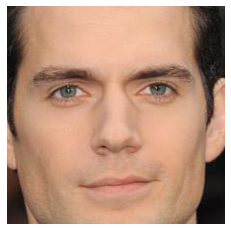

5
vip/data/m_162.jpg
[22.725742]
26.88093499


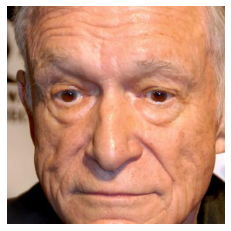

9
vip/data/m_166.jpg
[22.146896]
25.79591837


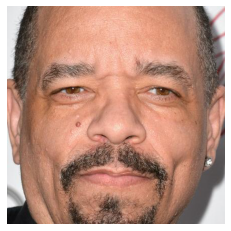

14
vip/data/m_171.jpg
[23.113476]
28.08641975


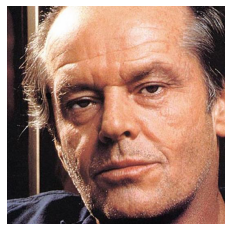

17
vip/data/m_174.jpg
[23.295778]
28.40818411


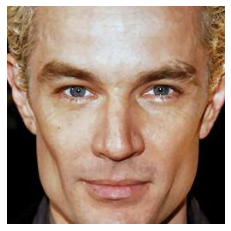

25
vip/data/m_182.jpg
[21.956104]
25.14285714


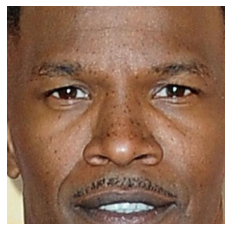

29
vip/data/m_186.jpg
[23.172]
26.775510200000006


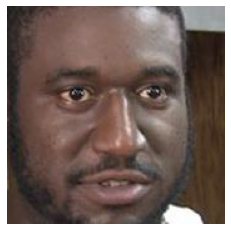

32
vip/data/m_189.jpg
[22.729986]
36.2899425


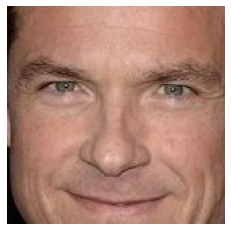

34
vip/data/m_191.jpg
[23.003036]
26.2345679


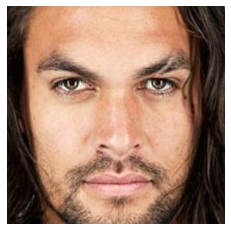

39
vip/data/m_197.jpg
[22.546719]
28.45713979


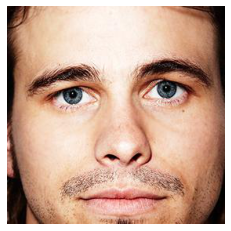

41
vip/data/m_199.jpg
[22.535408]
32.65306122


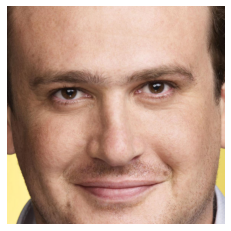

42
vip/data/m_200.jpg
[22.451664]
25.50404038


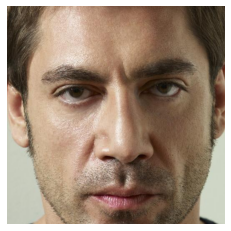

44
vip/data/m_202.jpg
[22.564747]
25.64024297


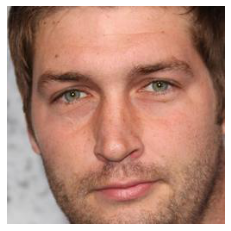

45
vip/data/m_203.jpg
[22.985868]
37.66478343


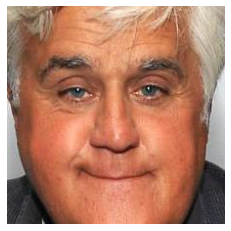

46
vip/data/m_204.jpg
[22.694145]
27.77777778


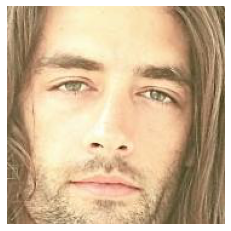

47
vip/data/m_205.jpg
[22.148153]
25.42001461


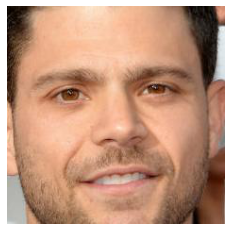

54
vip/data/m_212.jpg
[23.30289]
31.23941436


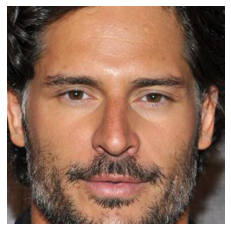

64
vip/data/m_224.jpg
[22.927738]
27.85297793


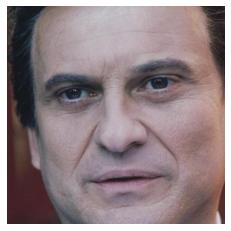

65
vip/data/m_225.jpg
[22.798355]
28.98114344


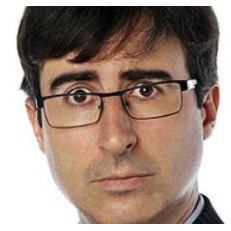

75
vip/data/m_237.jpg
[22.82861]
26.8744961


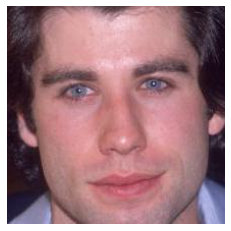

77
vip/data/m_239.jpg
[22.726507]
27.44454504


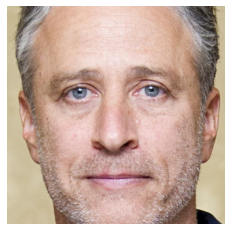

82
vip/data/m_244.jpg
[23.37251]
31.86162949


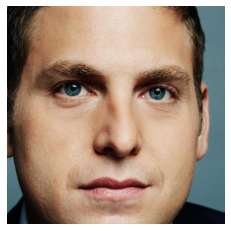

83
vip/data/m_245.jpg
[23.127882]
30.10380623


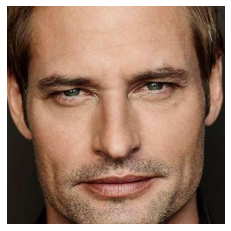

88
vip/data/m_253.jpg
[22.82861]
26.02304899


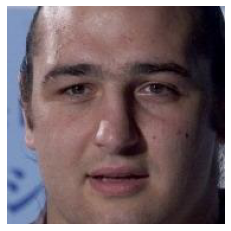

108
vip/data/m_279.jpg
[22.871624]
38.09847363


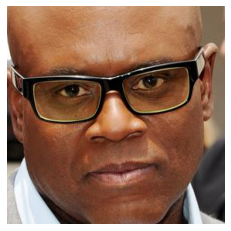

114
vip/data/m_285.jpg
[22.937593]
28.40816327


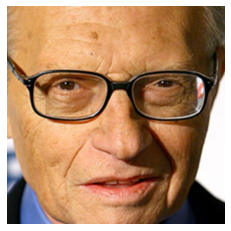

117
vip/data/m_289.jpg
[22.82861]
26.44897959


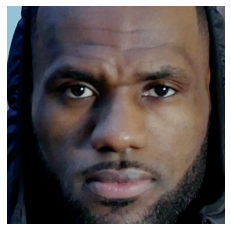

118
vip/data/m_290.jpg
[23.739384]
27.4211944


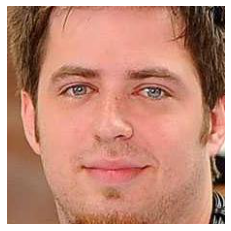

119
vip/data/m_291.jpg
[23.739384]
28.08163265


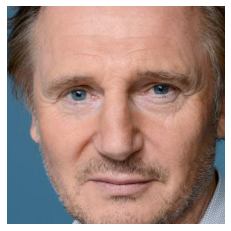

122
vip/data/m_295.jpg
[22.956186]
27.38328546


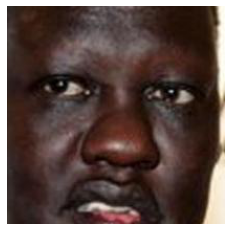

131
vip/data/m_304.jpg
[23.217667]
18.74027848


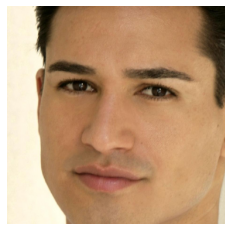

133
vip/data/m_308.jpg
[22.446125]
26.51180407


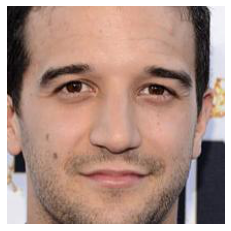

134
vip/data/m_309.jpg
[22.446125]
26.57312925


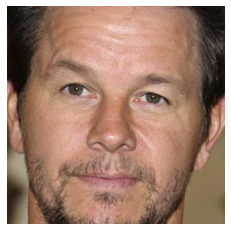

136
vip/data/m_312.jpg
[23.086334]
26.7299275


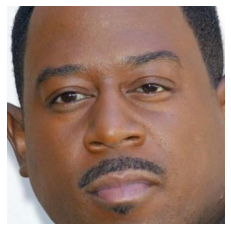

138
vip/data/m_314.jpg
[22.674232]
27.35884546


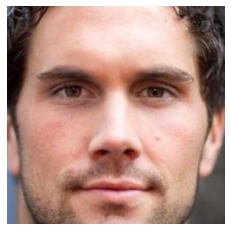

143
vip/data/m_321.jpg
[23.053627]
26.81174511


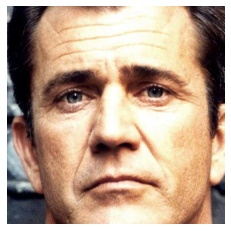

149
vip/data/m_329.jpg
[23.31268]
30.96172875


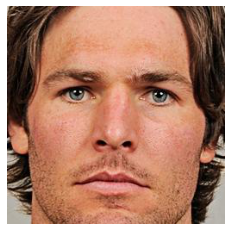

155
vip/data/m_338.jpg
[23.175156]
28.63403944


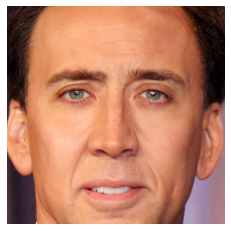

165
vip/data/m_350.jpg
[22.81768]
26.8744961


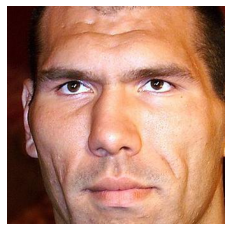

166
vip/data/m_351.jpg
[22.037127]
33.062223100000004


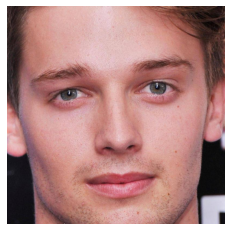

171
vip/data/m_356.jpg
[23.955029]
27.16049383


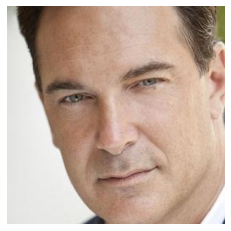

173
vip/data/m_358.jpg
[22.998386]
28.80886427


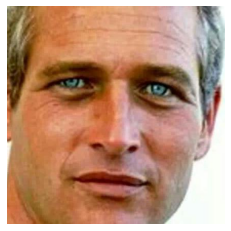

174
vip/data/m_359.jpg
[22.432312]
26.17383255


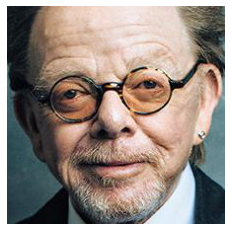

177
vip/data/m_364.jpg
[22.860264]
28.80441397


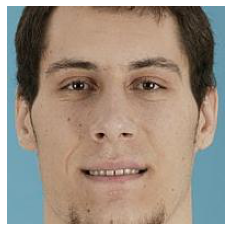

178
vip/data/m_365.jpg
[23.66718]
27.01856058


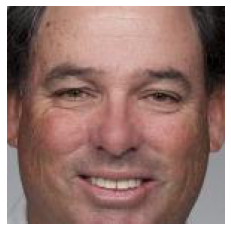

185
vip/data/m_374.jpg
[22.909794]
27.47456746


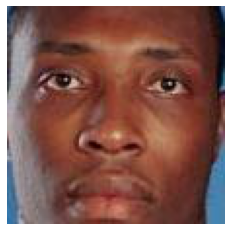

187
vip/data/m_376.jpg
[22.740507]
29.296875


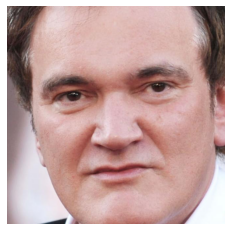

191
vip/data/m_381.jpg
[23.496466]
26.88093499


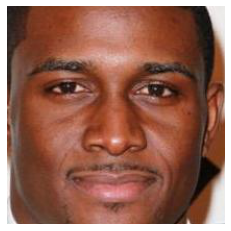

196
vip/data/m_388.jpg
[22.844023]
27.47170713


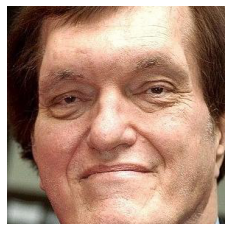

199
vip/data/m_391.jpg
[22.741566]
44.60903964


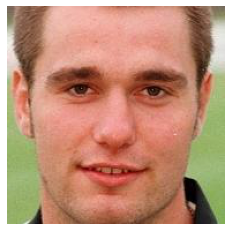

200
vip/data/m_392.jpg
[23.390753]
27.99268223


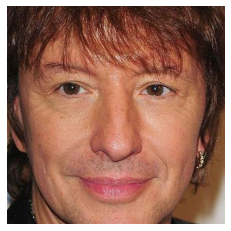

201
vip/data/m_394.jpg
[23.140749]
28.35538752


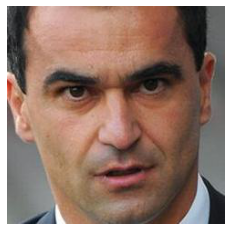

209
vip/data/m_403.jpg
[22.675821]
25.79591837


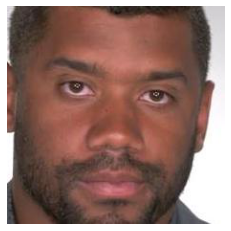

211
vip/data/m_408.jpg
[22.020374]
28.7037037


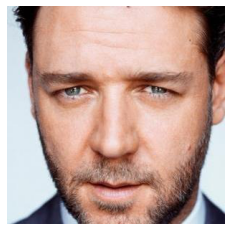

213
vip/data/m_410.jpg
[22.508257]
27.77442338


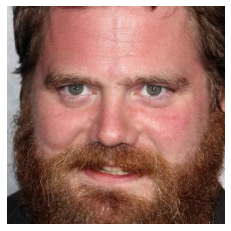

215
vip/data/m_413.jpg
[22.806831]
26.12244898


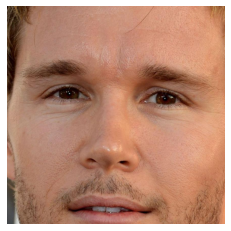

217
vip/data/m_415.jpg
[22.394644]
25.88057064


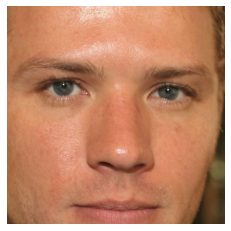

218
vip/data/m_416.jpg
[22.394644]
25.46938776


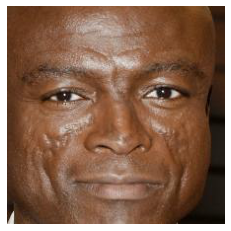

222
vip/data/m_427.jpg
[22.651]
28.21180556


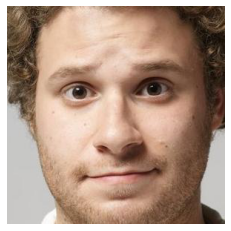

227
vip/data/m_435.jpg
[22.92428]
27.16049383


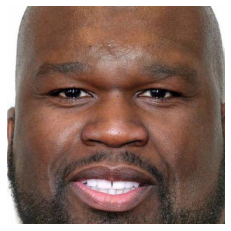

228
vip/data/m_436.jpg
[23.88359]
31.50720165


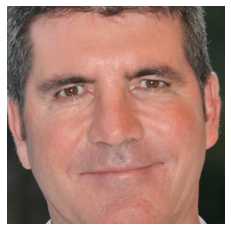

231
vip/data/m_440.jpg
[23.143377]
27.42857143


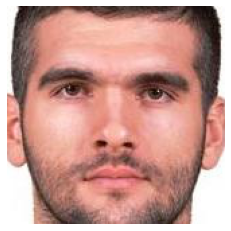

233
vip/data/m_442.jpg
[23.32958]
26.43120056


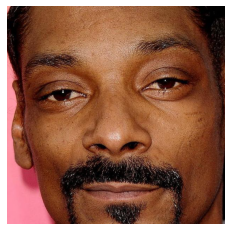

234
vip/data/m_443.jpg
[23.473116]
20.13476872


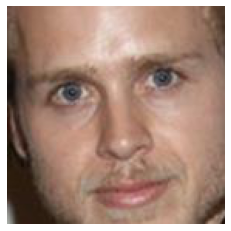

235
vip/data/m_444.jpg
[22.612364]
26.8744961


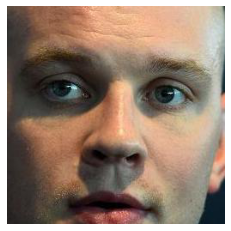

236
vip/data/m_445.jpg
[23.314434]
26.6998932


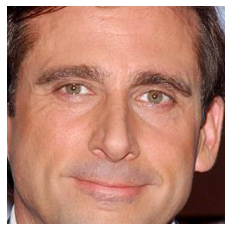

241
vip/data/m_450.jpg
[22.18116]
25.46938776


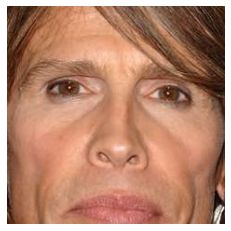

243
vip/data/m_452.jpg
[22.8546]
26.49302563


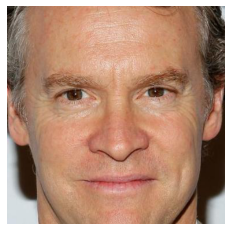

247
vip/data/m_456.jpg
[22.816969]
27.77031264


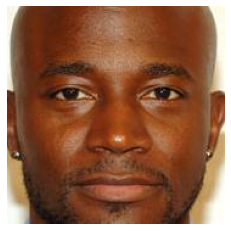

248
vip/data/m_457.jpg
[22.351913]
25.56495392


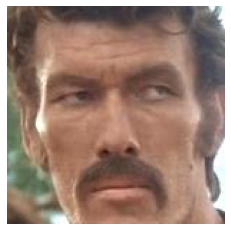

249
vip/data/m_459.jpg
[23.227913]
37.46818739


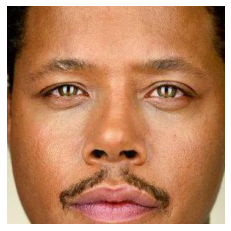

250
vip/data/m_460.jpg
[22.675896]
33.37665406


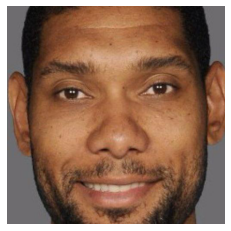

253
vip/data/m_464.jpg
[22.351913]
26.05512006


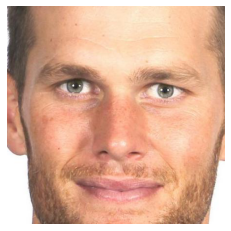

257
vip/data/m_468.jpg
[23.013992]
27.38328546


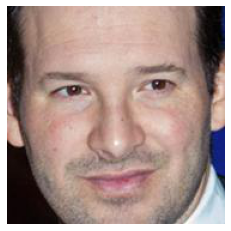

263
vip/data/m_475.jpg
[24.094044]
29.42507922


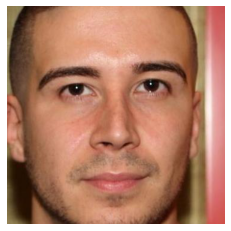

269
vip/data/m_484.jpg
[22.620531]
27.01685989


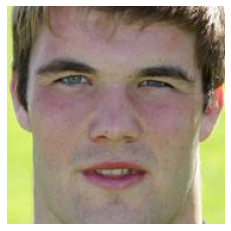

273
vip/data/m_488.jpg
[22.573734]
28.97509041


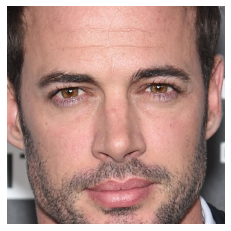

276
vip/data/m_491.jpg
[22.795343]
26.8744961


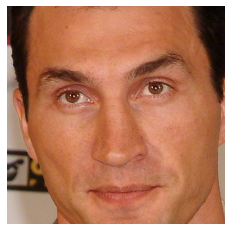

278
vip/data/m_494.jpg
[22.57634]
27.80328538


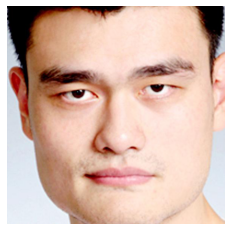

279
vip/data/m_495.jpg
[23.113092]
26.88735913


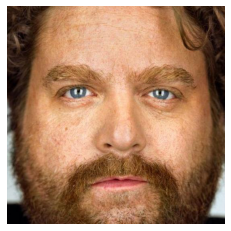

282
vip/data/m_498.jpg
[23.165272]
34.60207612


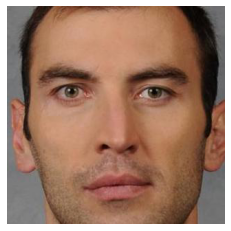

286
vip/data/m_502.jpg
[23.32628]
27.33528136


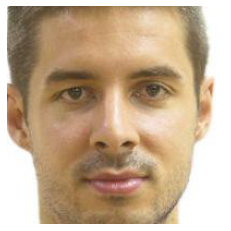

288
vip/data/m_508.jpg
[23.109158]
19.60592099


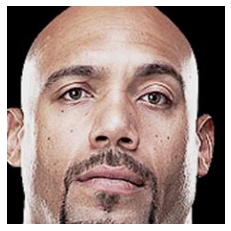

289
vip/data/m_509.jpg
[22.679398]
31.79737398


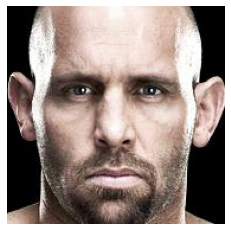

290
vip/data/m_511.jpg
[22.93642]
30.83974649


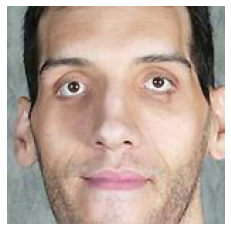

291
vip/data/m_513.jpg
[22.03667]
28.05020372


In [88]:
for i in range(len(y_pred)):
    if np.abs(y_pred[i] - dey_BMI_test[i]) > 3:
        img = mpimg.imread(y_df.loc[1174+i].path)
        plt.imshow(img) 
        plt.axis('off') 
        plt.show()
        print(i)
        print(y_df.loc[1174+i].path)
        print((y_pred + y_train.mean())[i])
        print((dey_BMI_test + y_train.mean())[i])

## Classification

In [340]:
from keras import optimizers
from keras import metrics

model_c = Sequential()
model_c.add(Dense(units=64, activation='tanh', input_dim=128))
model_c.add(Dense(units=32, activation='tanh'))
model_c.add(Dropout(0.2))
model_c.add(Dense(units=8, activation='tanh'))
model_c.add(Dropout(0.2))
model_c.add(Dense(units=4, activation='softmax'))

opt = optimizers.adam(lr=0.001)
def top_2(y_true, y_pred):
    return metrics.top_k_categorical_accuracy(y_true, y_pred, k=2)

model_c.compile(loss='categorical_crossentropy',
              optimizer=opt,
              metrics=['categorical_accuracy', top_2])
model_c.summary()

Model: "sequential_72"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_285 (Dense)            (None, 64)                8256      
_________________________________________________________________
dense_286 (Dense)            (None, 32)                2080      
_________________________________________________________________
dropout_94 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_287 (Dense)            (None, 8)                 264       
_________________________________________________________________
dropout_95 (Dropout)         (None, 8)                 0         
_________________________________________________________________
dense_288 (Dense)            (None, 4)                 36        
Total params: 10,636
Trainable params: 10,636
Non-trainable params: 0
_________________________________________________

In [341]:
model_c.fit(x_train_res, y_train_c, epochs=15, batch_size=32)

Epoch 1/15
3376/3376 [==============================] - 2s 563us/step - loss: 1.3345 - categorical_accuracy: 0.3472 - top_2: 0.6060
Epoch 2/15
3376/3376 [==============================] - 1s 166us/step - loss: 1.1980 - categorical_accuracy: 0.4775 - top_2: 0.7313
Epoch 3/15
3376/3376 [==============================] - 1s 166us/step - loss: 1.1272 - categorical_accuracy: 0.5148 - top_2: 0.7610
Epoch 4/15
3376/3376 [==============================] - 1s 177us/step - loss: 1.0927 - categorical_accuracy: 0.5320 - top_2: 0.7778
Epoch 5/15
3376/3376 [==============================] - 1s 161us/step - loss: 1.0590 - categorical_accuracy: 0.5601 - top_2: 0.7995
Epoch 6/15
3376/3376 [==============================] - 1s 166us/step - loss: 1.0421 - categorical_accuracy: 0.5610 - top_2: 0.8069
Epoch 7/15
3376/3376 [==============================] - 1s 178us/step - loss: 1.0332 - categorical_accuracy: 0.5643 - top_2: 0.8110
Epoch 8/15
3376/3376 [==============================] - 1s 164us/step - loss

In [342]:
y_pred = model_c.predict(x_test)
model_c.evaluate(x_test, y_test_c, batch_size=32)

147/147 [==============================] - 1s 6ms/step


[1.3477311629016384, 0.380952388048172, 0.7551020383834839]

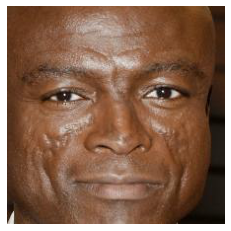

2
vip/data/m_427.jpg
0
2


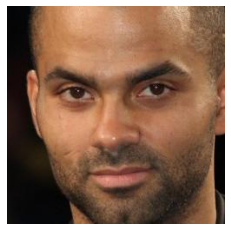

3
vip/data/m_474.jpg
2
1


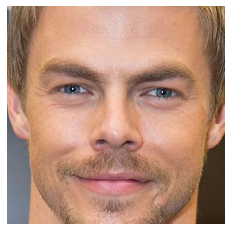

4
vip/data/m_099.jpg
2
1


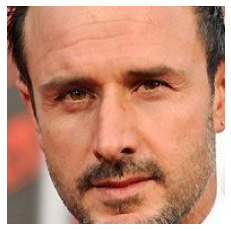

5
vip/data/m_087.jpg
0
1


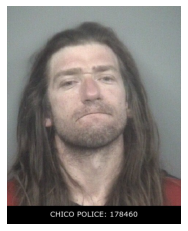

6
images/48.jpg
3
1


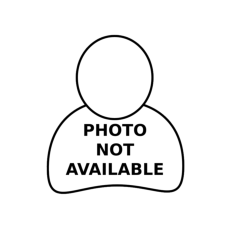

7
images/278.jpg
3
2


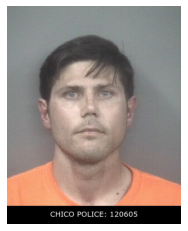

9
images/97.jpg
3
1


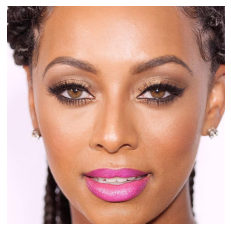

10
vip/data/f_267.jpg
1
0


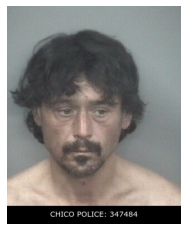

11
images/251.jpg
3
2


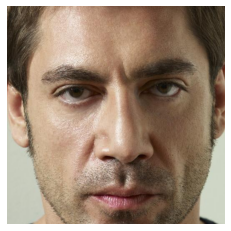

13
vip/data/m_202.jpg
0
2


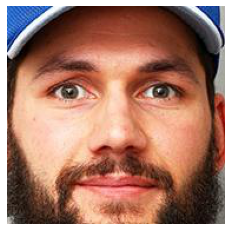

14
vip/data/m_299.jpg
3
2


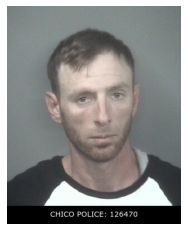

15
images/41.jpg
0
1


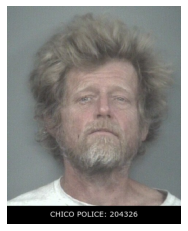

16
images/258.jpg
2
1


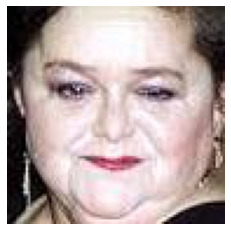

17
vip/data/f_505.jpg
1
3


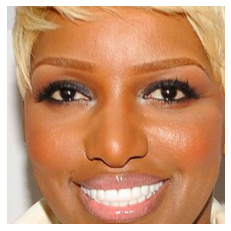

19
vip/data/f_383.jpg
0
1


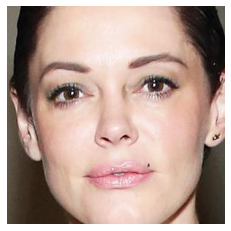

21
vip/data/f_434.jpg
0
1


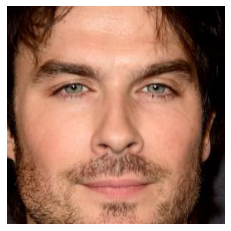

22
vip/data/m_170.jpg
3
1


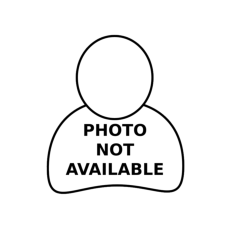

23
images/172.jpg
3
1


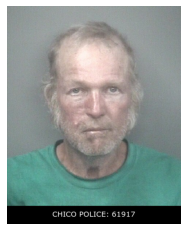

29
images/213.jpg
0
1


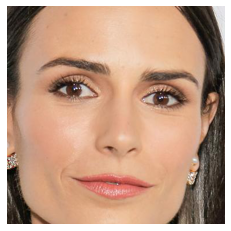

30
vip/data/f_220.jpg
0
1


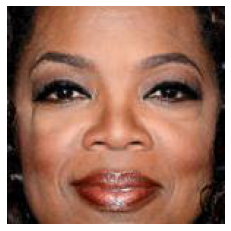

32
vip/data/f_397.jpg
3
2


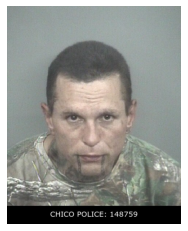

33
images/207.jpg
0
1


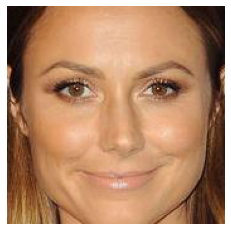

37
vip/data/f_473.jpg
1
0


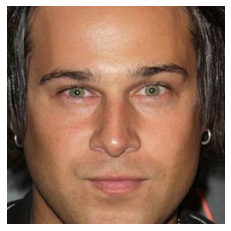

39
vip/data/m_412.jpg
2
1


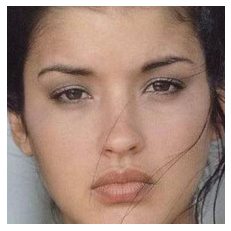

40
vip/data/f_189.jpg
0
1


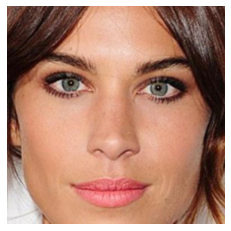

41
vip/data/f_006.jpg
2
1


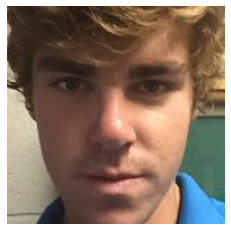

42
vip/data/m_389.jpg
2
1


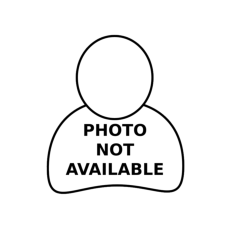

46
images/140.jpg
0
1


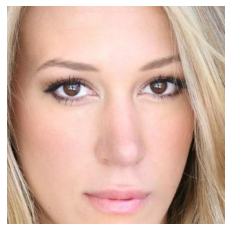

47
vip/data/f_161.jpg
3
1


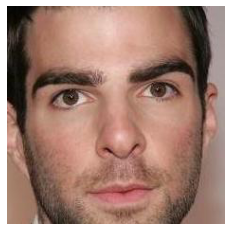

48
vip/data/m_500.jpg
3
1


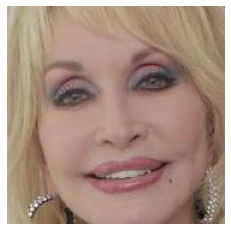

50
vip/data/f_101.jpg
0
1


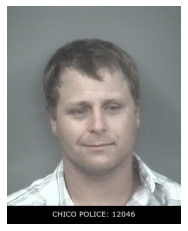

51
images/74.jpg
3
2


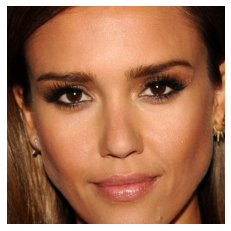

52
vip/data/f_208.jpg
0
1


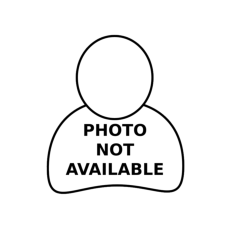

56
images/153.jpg
0
1


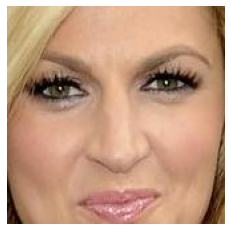

57
vip/data/f_127.jpg
1
0


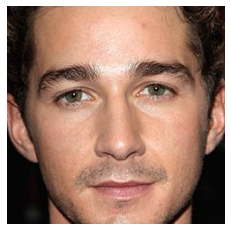

59
vip/data/m_438.jpg
2
1


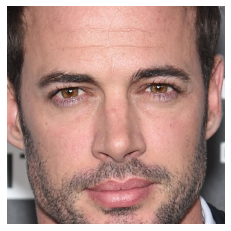

60
vip/data/m_491.jpg
0
2


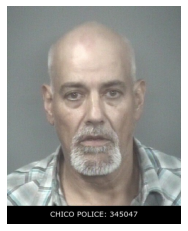

61
images/162.jpg
3
1


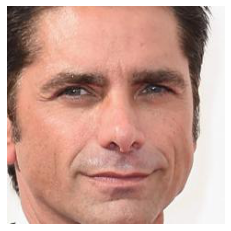

62
vip/data/m_238.jpg
1
2


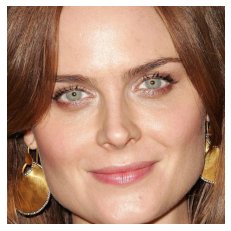

63
vip/data/f_120.jpg
0
1


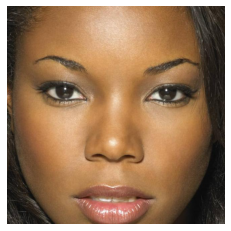

65
vip/data/f_146.jpg
3
1


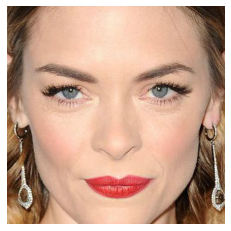

66
vip/data/f_180.jpg
3
1


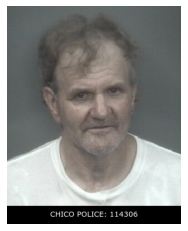

68
images/46.jpg
0
2


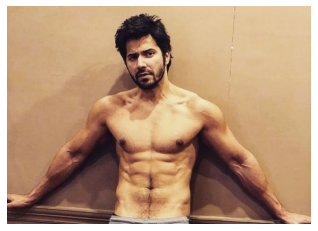

69
india_images/varun2.jpg
3
2


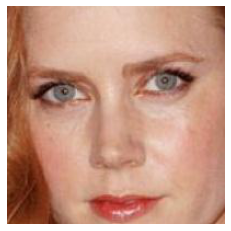

70
vip/data/f_014.jpg
3
1


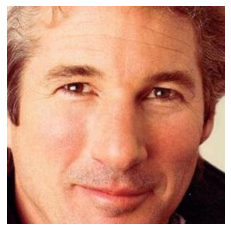

72
vip/data/m_390.jpg
3
1


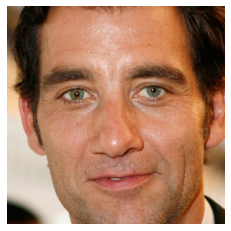

74
vip/data/m_068.jpg
0
1


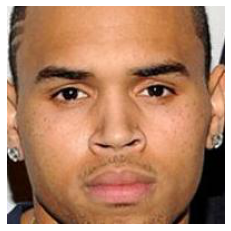

76
vip/data/m_052.jpg
0
1


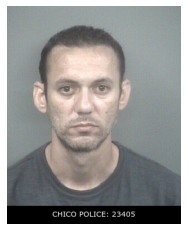

78
images/190.jpg
3
1


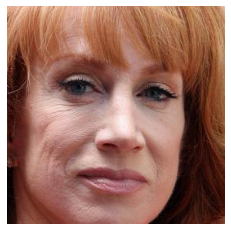

80
vip/data/f_249.jpg
0
1


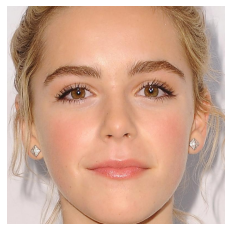

81
vip/data/f_273.jpg
3
0


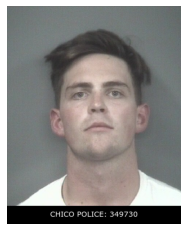

82
images/151.jpg
0
2


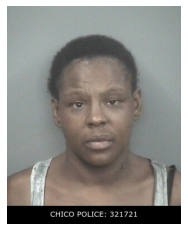

83
images/249.jpg
0
1


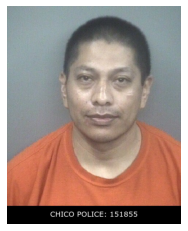

85
images/189.jpg
3
2


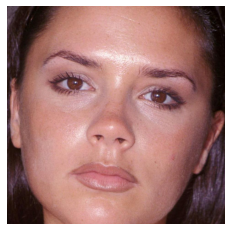

87
vip/data/f_498.jpg
1
0


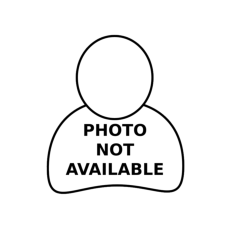

89
images/70.jpg
3
1


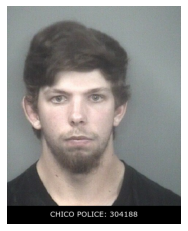

90
images/163.jpg
3
2


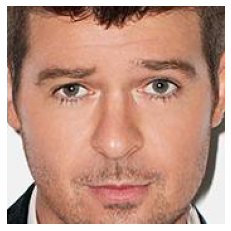

91
vip/data/m_404.jpg
3
2


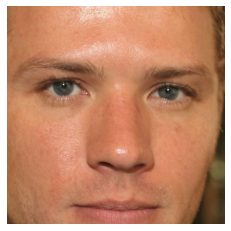

93
vip/data/m_416.jpg
0
2


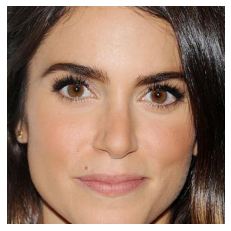

94
vip/data/f_391.jpg
2
1


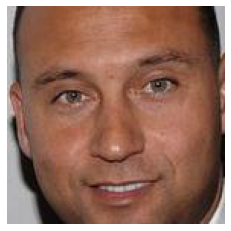

95
vip/data/m_100.jpg
0
1


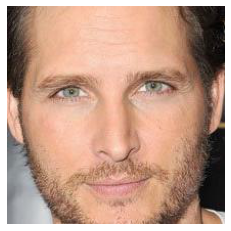

97
vip/data/m_369.jpg
1
2


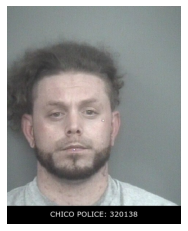

99
images/62.jpg
1
0


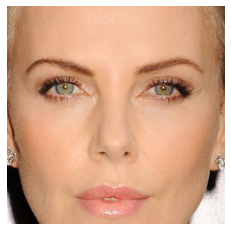

100
vip/data/f_066.jpg
3
0


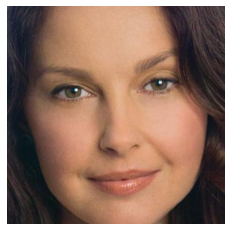

101
vip/data/f_027.jpg
0
1


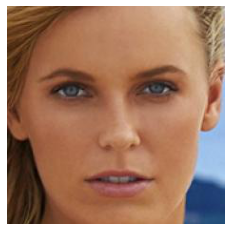

103
vip/data/f_056.jpg
3
0


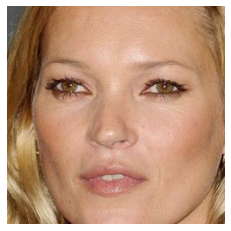

104
vip/data/f_242.jpg
0
1


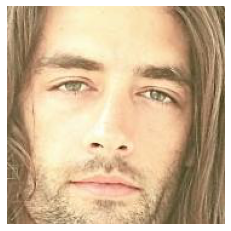

108
vip/data/m_205.jpg
1
2


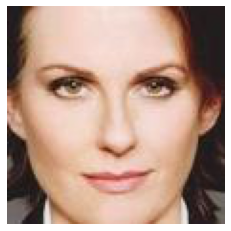

109
vip/data/f_350.jpg
3
2


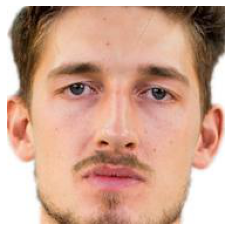

115
vip/data/m_462.jpg
0
1


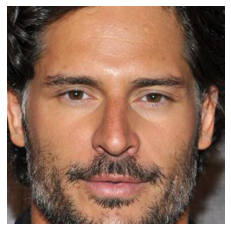

116
vip/data/m_224.jpg
1
2


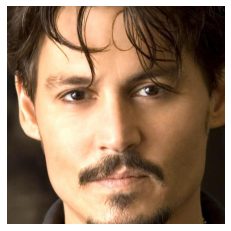

117
vip/data/m_240.jpg
3
1


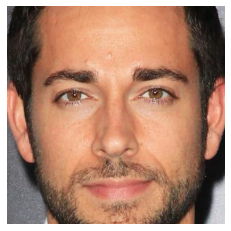

118
vip/data/m_499.jpg
3
1


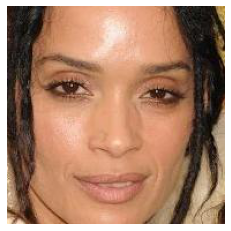

119
vip/data/f_316.jpg
0
1


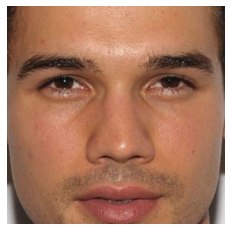

120
vip/data/m_451.jpg
2
1


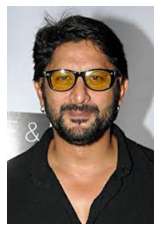

121
india_images/arshad1.jpg
2
1


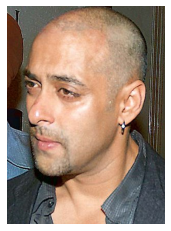

122
india_images/salman6.jpg
2
1


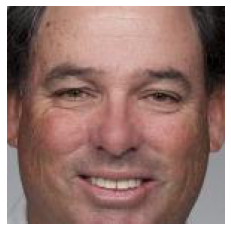

124
vip/data/m_374.jpg
1
2


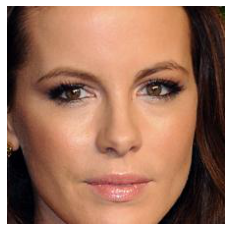

125
vip/data/f_237.jpg
2
1


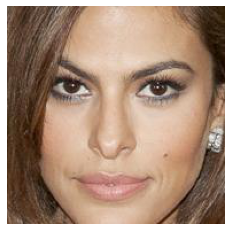

127
vip/data/f_131.jpg
3
1


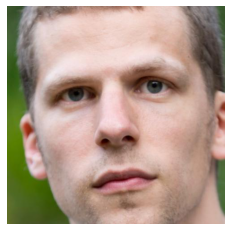

128
vip/data/m_215.jpg
3
1


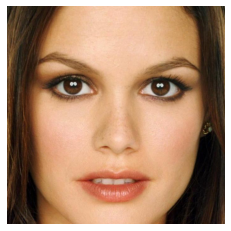

129
vip/data/f_413.jpg
3
1


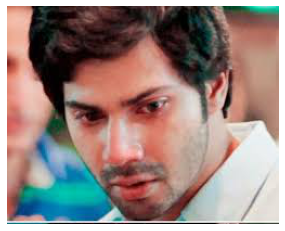

130
india_images/varun4.jpeg
1
2


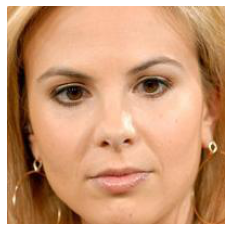

133
vip/data/f_104.jpg
2
1


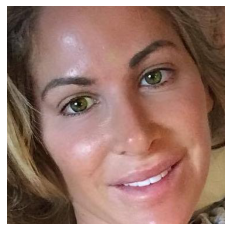

135
vip/data/f_276.jpg
0
1


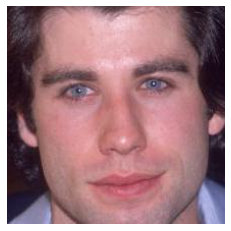

136
vip/data/m_239.jpg
1
2


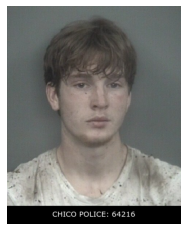

137
images/282.jpg
3
2


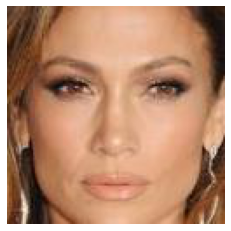

139
vip/data/f_204.jpg
3
1


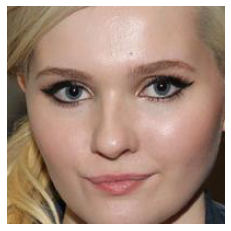

141
vip/data/f_001.jpg
1
2


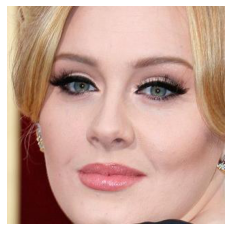

142
vip/data/f_002.jpg
1
2


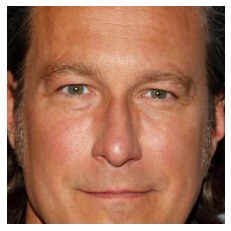

145
vip/data/m_229.jpg
3
2


In [343]:
for i in range(len(test)):
    if y_pred[i].argmax() != y_test_c[i].argmax():
        img = mpimg.imread(y_df.loc[test[i]].path)
        plt.imshow(img) 
        plt.axis('off') 
        plt.show()
        print(i)
        print(y_df.loc[test[i]].path)
        print(y_pred[i].argmax())
        print(y_test_c[i].argmax())

In [221]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE

kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=81000)
sm = SMOTE(random_state=810)
X_res, CY_res = sm.fit_resample(X, CY_BMI_list)

cvscores = []

for train, test in kfold.split(X_res, CY_res):
    
    CY = np.array(CY_res)
    CY = np.where(CY == "Underweight", '0', CY)
    CY = np.where(CY == 'Normalweight', '1', CY)
    CY = np.where(CY == 'Pre-obesity', '2', CY)
    CY = np.where(CY == "Obesity", '3', CY)
    CY = to_categorical(CY, num_classes = 4)
    
    model_c = Sequential()
    model_c.add(Dense(units=64, activation='tanh', input_dim=128))
    model_c.add(Dense(units=32, activation='tanh'))
    model_c.add(Dropout(0.2))
    model_c.add(Dense(units=8, activation='tanh'))
    model_c.add(Dropout(0.2))
    model_c.add(Dense(units=4, activation='softmax'))

    opt = optimizers.adam(lr=0.001)
    def top_2(y_true, y_pred):
        return metrics.top_k_categorical_accuracy(y_true, y_pred, k=2)

    model_c.compile(loss='categorical_crossentropy',
                  optimizer=opt,
                  metrics=['categorical_accuracy', top_2])
    
    model_c.fit(X_res[train], CY[train], epochs=15, batch_size=32)
    scores = model_c.evaluate(X_res[test], CY[test], verbose=0)
    print("%s: %.2f%%" % (model_c.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/15
2995/2995 [==============================] - 2s 643us/step - loss: 1.3389 - categorical_accuracy: 0.3563 - top_2: 0.6124
Epoch 2/15
2995/2995 [==============================] - 0s 154us/step - loss: 1.2455 - categorical_accuracy: 0.4514 - top_2: 0.7022
Epoch 3/15
2995/2995 [==============================] - 0s 158us/step - loss: 1.1747 - categorical_accuracy: 0.4942 - top_2: 0.7366
Epoch 4/15
2995/2995 [==============================] - 1s 221us/step - loss: 1.1385 - categorical_accuracy: 0.5105 - top_2: 0.7609
Epoch 5/15
2995/2995 [==============================] - 0s 157us/step - loss: 1.1103 - categorical_accuracy: 0.5215 - top_2: 0.7843
Epoch 6/15
2995/2995 [==============================] - 0s 153us/step - loss: 1.0901 - categorical_accuracy: 0.5306 - top_2: 0.7850
Epoch 7/15
2995/2995 [==============================] - 0s 156us/step - loss: 1.0948 - categorical_accuracy: 0.5396 - top_2: 0.7957
Epoch 8/15
2995/2995 [==============================] - 0s 156us/step - loss